In [1]:
import numpy as np
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import glob
import time
import pandas as pd
from statistics import mean
import math

# plt.rcParams["figure.figsize"] = (3,3)
print (time.ctime())

Sat Apr 24 17:34:50 2021


In [2]:
# file2 = "E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1_time.csv"
# print (file2, time.ctime())

# data2 =pd.read_csv(file2)
# print(pd.read_csv(file2, nrows=5))
# print(time.ctime())
# print(data2.shape)

In [5]:
# file1 = "/home/imaginglab/Data/TPX3/CHIP0/Test/8x8Grid_visEq_1s_W0028_F03-200228-095644-1.csv"
# file1 ="/home/andrei//Data/TPX3/CHIP0/Test/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1.csv"
file1 ="E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1.csv"
print (file1, time.ctime())

data1 = pd.read_csv(file1) 
print(pd.read_csv(file1, nrows=5))
print(time.ctime())


# file2 = "/home/imaginglab/Data/TPX3/CHIP0/Test/8x8Grid_SettingsEq_1s_W0028_F03-200228-100050-1.csv"
# file2 = "/home/andrei//Data/TPX3/CHIP0/Test/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1_time.csv"
file2 = "E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1_time.csv"
print (file2, time.ctime())

data2 =pd.read_csv(file2)
print(pd.read_csv(file2, nrows=5))
print(time.ctime())

E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1.csv Sat Apr 24 17:37:09 2021
   #TrigId     #TrigTime  #Col  #Row          #ToA  #ToT[arb]  #ToTtotal[arb]  \
0      911  149373049216    22   244  149428990720         75              75   
1      911  149373049216    22   252  149429186816         75              75   
2      911  149373049216    22   240  149429210368         25              25   
3      911  149373049216    22   250  149429216512         25              25   
4      911  149373049216   166    69  149430058752        200             200   

   #Trig-ToA[arb]  Unnamed: 8  
0        55941504         NaN  
1        56137600         NaN  
2        56161152         NaN  
3        56167296         NaN  
4        57009536         NaN  
Sat Apr 24 17:37:23 2021
E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1_time.csv Sat Apr 24 17:37:23 2021
   #TrigId  #TrigTime  #TrigTimeNext  #Events Unnamed: 4
0        1   228

In [6]:
data1.shape, data2.shape

((17616012, 9), (6945, 5))

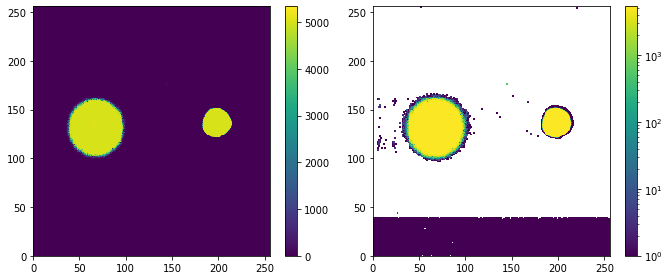

In [8]:
#File 1 grid
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9.5, 4))

h = ax0.hist2d(data1['#Row'], data1['#Col'], bins = 256, range = [(0, 256), (0, 256)])
fig.colorbar(h[3], ax = ax0)

h = ax1.hist2d(data1['#Row'], data1['#Col'], bins = 256, range = [(0, 256), (0, 256)], norm=mpl.colors.LogNorm())
fig.colorbar(h[3], ax = ax1)
fig.tight_layout()
plt.show()

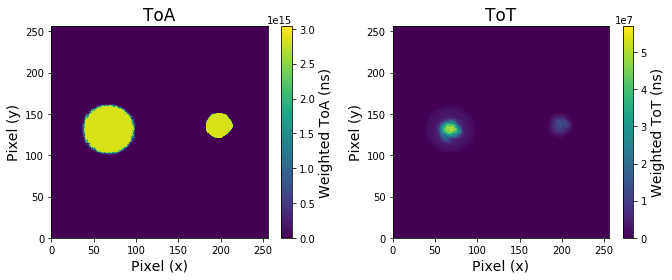

In [32]:
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9.5, 4), facecolor='w')
# data1['#Row'], data1['#Col'], bins = GridX1max-GridX1min, range = [(GridX1min, GridX1max), (GridY1min, GridY1max)]
h = ax0.hist2d(data1['#Row'], 
               data1['#Col'], 
               weights=data1['#ToA'], 
               bins = 256, range = [(0, 256), (0, 256)],
               )
cbar1 = fig.colorbar(h[3], ax = ax0)
#     cbar1.set_ticks([0,50,100,150,200,250])
#     tick_locator = ticker.MaxNLocator(nbins=6)
#     cbar1.locator = tick_locator
#     cbar1.update_ticks()
cbar1.set_label('Weighted ToA (ns)', fontsize=14)
ax0.set_xlabel('Pixel (x)', fontsize=14)
ax0.set_ylabel('Pixel (y)', fontsize=14)
ax0.set_title('ToA', fontsize=17)

h = ax1.hist2d(data1['#Row'], 
               data1['#Col'], 
               weights=data1['#ToT[arb]'], 
               bins = 256, range = [(0, 256), (0, 256)],
               )
cbar2 = fig.colorbar(h[3], ax = ax1)
#     cbar2.set_ticks([0,300,600,900,1200,1500])
#     tick_locator = ticker.MaxNLocator(nbins=6)
#     cbar2.locator = tick_locator
#     cbar2.update_ticks()
cbar2.set_label('Weighted ToT (ns)', fontsize=14)
ax1.set_xlabel('Pixel (x)', fontsize=14)
ax1.set_ylabel('Pixel (y)', fontsize=14)
ax1.set_title('ToT', fontsize=17)
fig.tight_layout()

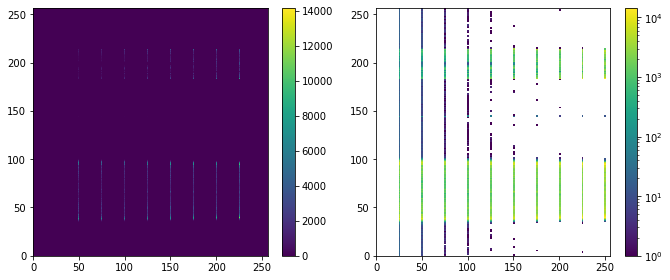

In [12]:
#File 1 grid
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9.5, 4))

h = ax0.hist2d(data1['#ToT[arb]'], data1['#Row'], bins = 256, range = [(0, 256), (0, 256)])
fig.colorbar(h[3], ax = ax0)

h = ax1.hist2d(data1['#ToT[arb]'], data1['#Row'], bins = 256, range = [(0, 256), (0, 256)], norm=mpl.colors.LogNorm())
fig.colorbar(h[3], ax = ax1)
fig.tight_layout()
plt.show()

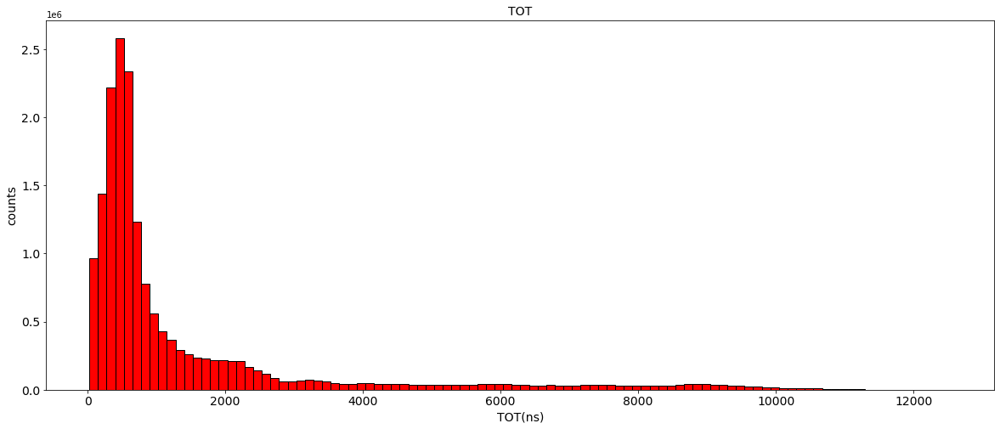

In [43]:
fig, ax1 = plt.subplots(ncols=1, figsize=(20, 8))

nbins = 100

plt.hist(data1['#ToT[arb]'], bins= nbins, range = [data1['#ToT[arb]'].min(), data1['#ToT[arb]'].max()], color = 'r', ec = 'k')
plt.title("TOT", fontsize = 14) # change the title
plt.xlabel('TOT(ns)',fontsize = 14)
plt.ylabel('counts',fontsize = 14)
plt.tick_params(labelsize=14)
# plt.hist(Pt1_df['#ToT[arb]'], bins= nbins, range = [0, 20000], lw=3, histtype='step', label = 'file 2', color = 'red')

# plt.xlabel('ToT, ns')
# plt.legend()
plt.show()

'Sat Apr 24 19:15:22 2021'

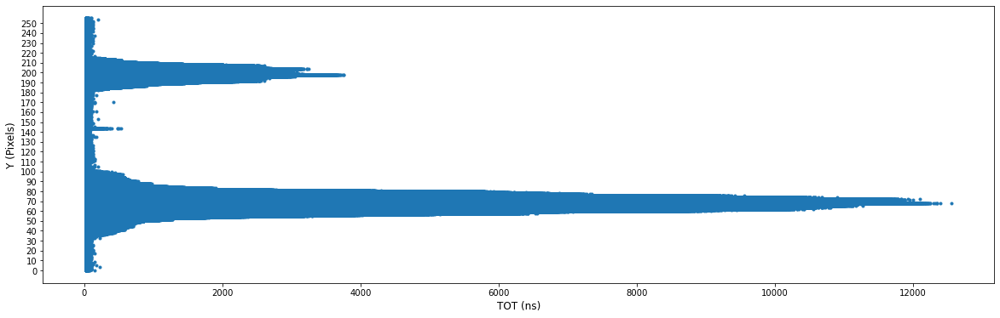

In [22]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]

plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
#180,220  30,110
#  20, 120, 80, 180
plt.plot(data1['#ToT[arb]'], data1['#Row'],'.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOT (ns)',fontsize = 12)
plt.ylabel('X (Pixels)',fontsize = 12)
plt.yticks(np.arange(data1['#Row'].min(), data1['#Row'].max(), step=10))

# for i in range(5000):
#     plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
#     plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# # plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
# plt.xlim(3.03e9, 3.032e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbox_inches='tight')
time.ctime()

In [28]:
firstPeak = data1[(data1["#Row"]>180) & (data1["#Row"]<220)]

'Sat Apr 24 19:47:25 2021'

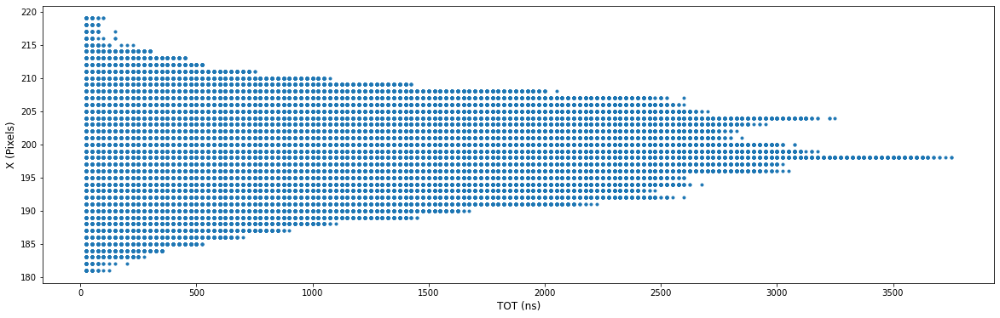

In [38]:
plt.rcParams["figure.figsize"] = (20,6)
plt.plot(firstPeak['#ToT[arb]'], firstPeak['#Row'],'.')
plt.xlabel('TOT (ns)',fontsize = 12)
plt.ylabel('X (Pixels)',fontsize = 12)
# plt.yticks(np.arange(firstPeak['#Row'].min(), firstPeak['#Row'].max(), step=10))
time.ctime()

In [30]:
zerothPeak = data1[(data1["#Row"]>30) & (data1["#Row"]<110)]

'Sat Apr 24 19:47:34 2021'

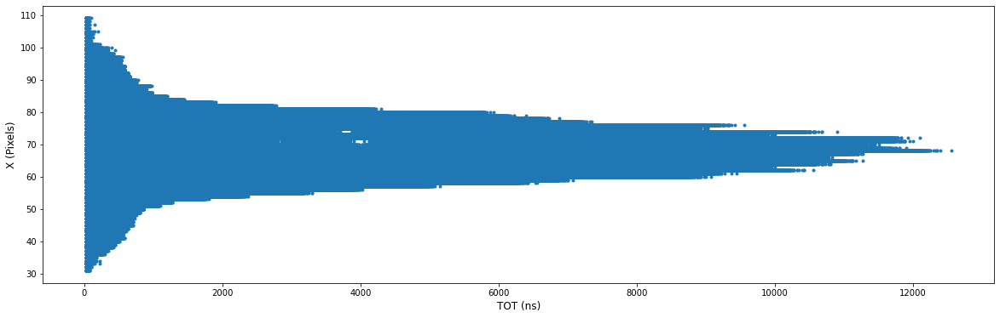

In [39]:
plt.rcParams["figure.figsize"] = (20,6)
plt.plot(zerothPeak['#ToT[arb]'], zerothPeak['#Row'],'.')
plt.xlabel('TOT (ns)',fontsize = 12)
plt.ylabel('X (Pixels)',fontsize = 12)
# plt.yticks(np.arange(zerothPeak['#Row'].min(), zerothPeak['#Row'].max(), step=10))
time.ctime()

In [36]:
sumzero = np.nansum(zerothPeak["#ToT[arb]"])
sumfirst = np.nansum(firstPeak["#ToT[arb]"])
sumtotal = np.nansum(data1["#ToT[arb]"])
print("Sum of first order peak TOT:", sumzero, "\n Sum of zeroth order peak TOT:", sumfirst, "\n Sum of all TOT:", sumtotal, \
      "\n % of ToT in zeroth:", (sumzero/sumtotal)*100, "\n % of ToT in first:", (sumfirst/sumtotal)*100) 

Sum of first order peak TOT: 21703202425 
 Sum of zeroth order peak TOT: 3870489275 
 Sum of all TOT: 25573927350 
 % of ToT in zeroth: 84.86456588373784 
 % of ToT in first: 15.13451266999083


In [7]:
YOfPeak = 133
Yslice_df = data1[(data1['#Col']<(YOfPeak+5)) & (data1['#Col']>(YOfPeak-5))]

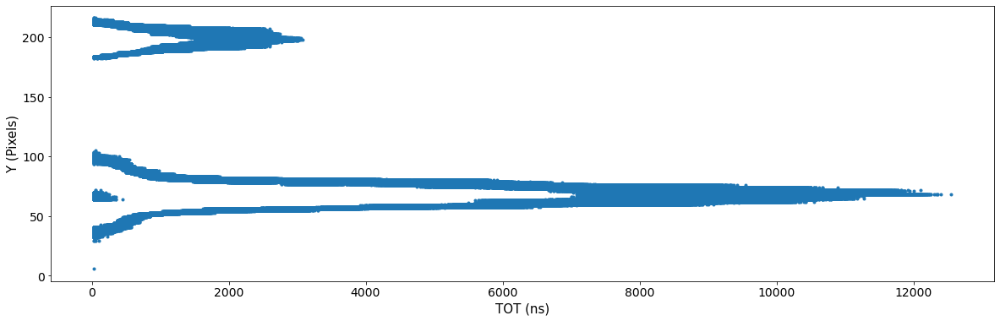

In [14]:
plt.rcParams["figure.figsize"] = (20,6)
plt.plot(Yslice_df['#ToT[arb]'], Yslice_df['#Row'],'.')
plt.xlabel('TOT (ns)',fontsize = 15)
plt.ylabel('Y (Pixels)',fontsize = 15)
plt.tick_params(labelsize=14)

In [42]:
ToTmax_df = data1[data1['#ToT[arb]'] == (data1['#ToT[arb]'].max())]
xOfPeak = ToTmax_df['#Col'].min()
print(xOfPeak)
slice_df = data1[(data1['#Col']<(xOfPeak+10)) & (data1['#Col']>(xOfPeak-10))]

133


/home/andrei/.local/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/home/andrei/.local/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/home/andrei/.local/lib/python3.6/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


Text(0, 0.5, 'Y (Pixels)')

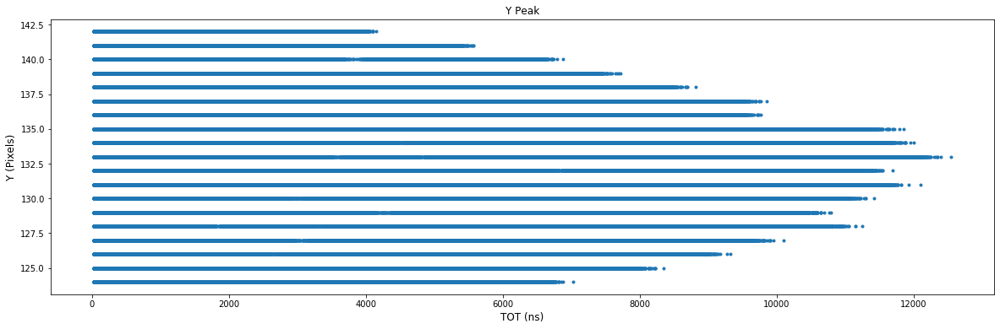

In [43]:
plt.rcParams["figure.figsize"] = (20,6)

plt.plot(slice_df['#ToT[arb]'], slice_df['#Col'],'.')
#plt.plot(r, f, 'xb-')
plt.title("Y Peak", fontsize = 12) # change the title
plt.xlabel('TOT (ns)',fontsize = 12)
plt.ylabel('Y (Pixels)',fontsize = 12)

In [36]:
firstOrderX_df = data1[(data1['#Row']<(250)) & (data1['#Row']>(150))]

firstOrder_ToTmax_df = firstOrderX_df[firstOrderX_df['#ToT[arb]'] == (firstOrderX_df['#ToT[arb]'].max())]
xOfPeak = firstOrder_ToTmax_df['#Row'].min()
print(xOfPeak)
firstOrder_slice_df = data1[(data1['#Row']<(xOfPeak+10)) & (data1['#Row']>(xOfPeak-10))]

198


Text(0, 0.5, 'X (Pixels)')

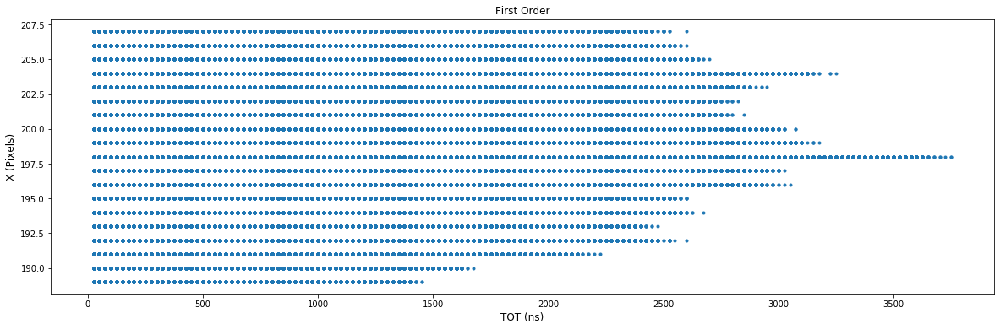

In [39]:
plt.rcParams["figure.figsize"] = (20,6)

plt.plot(firstOrder_slice_df['#ToT[arb]'], firstOrder_slice_df['#Row'],'.')
#plt.plot(r, f, 'xb-')
plt.title("First Order", fontsize = 12) # change the title
plt.xlabel('TOT (ns)',fontsize = 12)
plt.ylabel('X (Pixels)',fontsize = 12)

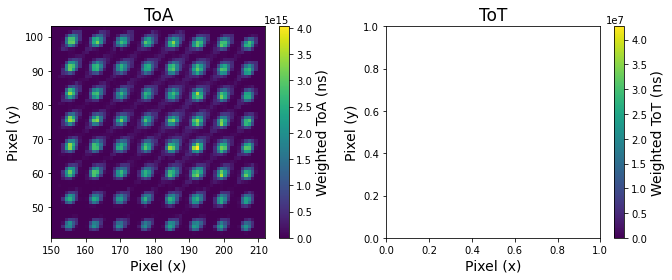

In [48]:
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9.5, 4), facecolor='w')
# data1['#Row'], data1['#Col'], bins = GridX1max-GridX1min, range = [(GridX1min, GridX1max), (GridY1min, GridY1max)]
h = ax0.hist2d(data1['#Row'], 
               data1['#Col'], 
               weights=data1['#ToA'], 
               bins = GridX1max-GridX1min, range = [(GridX1min, GridX1max), (GridY1min, GridY1max)],
               )
cbar1 = fig.colorbar(h[3], ax = ax0)
#     cbar1.set_ticks([0,50,100,150,200,250])
#     tick_locator = ticker.MaxNLocator(nbins=6)
#     cbar1.locator = tick_locator
#     cbar1.update_ticks()
cbar1.set_label('Weighted ToA (ns)', fontsize=14)
ax0.set_xlabel('Pixel (x)', fontsize=14)
ax0.set_ylabel('Pixel (y)', fontsize=14)
ax0.set_title('ToA', fontsize=17)

h = ax0.hist2d(data1['#Row'], 
               data1['#Col'], 
               weights=data1['#ToT[arb]'], 
               bins = GridX1max-GridX1min, range = [(GridX1min, GridX1max), (GridY1min, GridY1max)],
               )
cbar2 = fig.colorbar(h[3], ax = ax1)
#     cbar2.set_ticks([0,300,600,900,1200,1500])
#     tick_locator = ticker.MaxNLocator(nbins=6)
#     cbar2.locator = tick_locator
#     cbar2.update_ticks()
cbar2.set_label('Weighted ToT (ns)', fontsize=14)
ax1.set_xlabel('Pixel (x)', fontsize=14)
ax1.set_ylabel('Pixel (y)', fontsize=14)
ax1.set_title('ToT', fontsize=17)
fig.tight_layout()

In [2]:
# file1 = "E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1.csv"
# print (file1, time.ctime())

# data1 =pd.read_csv(file1)
# print(pd.read_csv(file1, nrows=5))
# print(time.ctime())
# print(data1.shape)

E:/Data/AOM3242021/AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1.csv Wed Apr  7 17:00:57 2021
   #TrigId     #TrigTime  #Col  #Row          #ToA  #ToT[arb]  #ToTtotal[arb]  \
0      911  149373049216    22   244  149428990720         75              75   
1      911  149373049216    22   252  149429186816         75              75   
2      911  149373049216    22   240  149429210368         25              25   
3      911  149373049216    22   250  149429216512         25              25   
4      911  149373049216   166    69  149430058752        200             200   

   #Trig-ToA[arb]  Unnamed: 8  
0        55941504         NaN  
1        56137600         NaN  
2        56161152         NaN  
3        56167296         NaN  
4        57009536         NaN  
Wed Apr  7 17:01:13 2021
(17616012, 9)


In [4]:
# def min_max(data, grid_x_min, grid_x_max, grid_y_min, grid_y_max):
#     """Returns DataFrame filtering values less than min or greater than max for two columns"""
#     x_cond = (data['#Row'] >grid_x_min) & (data['#Row'] < grid_x_max)
#     y_cond = (data['#Col'] > grid_y_min) & (data['#Col'] < grid_y_max)
#     new_data = data[x_cond & y_cond]
#     return new_data



In [5]:
# oth_df = min_max(data1, 20, 120, 80, 180)
# # Pt1_ToT_df = grid1_df.drop(grid1_df[(grid1_df['#ToT[arb]'] > tMin2) & (grid1_df['#ToT[arb]'] < tMax2)].index)

# print(oth_df.shape, type(oth_df.iloc[0,0]), type(oth_df.iloc[1,1]), time.ctime())
# print(oth_df.iloc[:3])

(13944554, 9) <class 'numpy.int64'> <class 'numpy.int64'> Wed Apr  7 17:02:23 2021
   #TrigId     #TrigTime  #Col  #Row          #ToA  #ToT[arb]  #ToTtotal[arb]  \
4      911  149373049216   166    69  149430058752        200             200   
6      911  149373049216    99    73  149432151040        100             100   
7      911  149373049216   166    65  149432185600         50              50   

   #Trig-ToA[arb]  Unnamed: 8  
4        57009536         NaN  
6        59101824         NaN  
7        59136384         NaN  


In [6]:
# first_df = min_max(data1, 170, 230, 110, 170)
# # Pt1_ToT_df = grid1_df.drop(grid1_df[(grid1_df['#ToT[arb]'] > tMin2) & (grid1_df['#ToT[arb]'] < tMax2)].index)

# print(first_df.shape, type(first_df.iloc[0,0]), type(first_df.iloc[1,1]), time.ctime())
# print(first_df.iloc[:3])

(3662693, 9) <class 'numpy.int64'> <class 'numpy.int64'> Wed Apr  7 17:02:23 2021
     #TrigId     #TrigTime  #Col  #Row          #ToA  #ToT[arb]  \
5        911  149373049216   136   216  149430376704         25   
32       911  149373049216   138   216  149433788672        150   
165      911  149373049216   134   216  149441108480         50   

     #ToTtotal[arb]  #Trig-ToA[arb]  Unnamed: 8  
5                25        57327488         NaN  
32              150        60739456         NaN  
165              50        68059264         NaN  


In [7]:
# othtot = oth_df['#ToT[arb]'].to_numpy()
# othtotavg = np.nanmean(othtot)
# print(othtotavg)

1556.3854838957202


In [8]:
# firsttot = first_df['#ToT[arb]'].to_numpy()
# firstotavg = np.nanmean(firsttot)
# print(firstotavg)

1056.7199462253593


In [9]:
# print("DE:", (firstotavg/othtotavg)*100, "%")

DE: 67.89577242652828 %


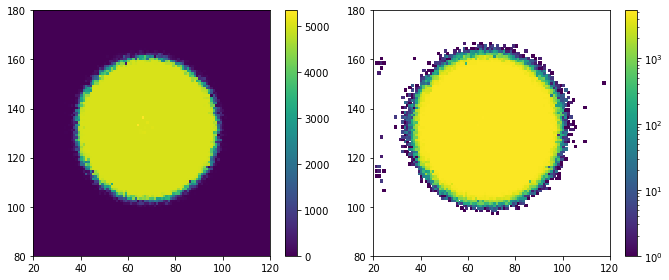

In [13]:
# file1 ="E:/Data/AOM242021/AOM_5s_10usGW_80MHz_FC_APC_1Vpp_W0028_H07-210204-144349-1.csv"
# h = ax0.hist2d(data1['#Row'], data1['#Col'], bins = 100, range = [(0, 100), (100, 200)])
# fig.colorbar(h[3], ax = ax0)

# h = ax1.hist2d(data1['#Row'], data1['#Col'], bins = 100, range = [(0, 100), (100, 200)], norm=mpl.colors.LogNorm())
#File 1 grid

# AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9.5, 4))

h = ax0.hist2d(data1['#Row'], data1['#Col'], bins = 100, range = [(20, 120), (80, 180)])
fig.colorbar(h[3], ax = ax0)

h = ax1.hist2d(data1['#Row'], data1['#Col'], bins = 100, range = [(20, 120), (80, 180)], norm=mpl.colors.LogNorm())
fig.colorbar(h[3], ax = ax1)

fig.tight_layout()
plt.show()
# fig.savefig('fullgrid_8212020_025044-1_cent.png')

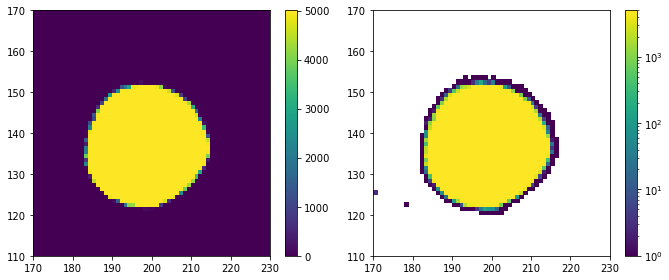

In [11]:
# file1 ="E:/Data/AOM242021/AOM_5s_10usGW_80MHz_FC_APC_1Vpp_W0028_H07-210204-144349-1.csv"
# h = ax0.hist2d(data1['#Row'], data1['#Col'], bins = 60, range = [(115, 175), (130, 190)])
# fig.colorbar(h[3], ax = ax0)

# h = ax1.hist2d(data1['#Row'], data1['#Col'], bins = 60, range = [(115, 175), (130, 190)], norm=mpl.colors.LogNorm())
#File 1 grid

# AOM_3242021_1.5V_100nsPW_1usDelay__W0028_H07-210324-183439-1
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(9.5, 4))

h = ax0.hist2d(data1['#Row'], data1['#Col'], bins = 60, range = [(170, 230), (110, 170)])
fig.colorbar(h[3], ax = ax0)

h = ax1.hist2d(data1['#Row'], data1['#Col'], bins = 60, range = [(170, 230), (110, 170)], norm=mpl.colors.LogNorm())
fig.colorbar(h[3], ax = ax1)

fig.tight_layout()
plt.show()
# fig.savefig('fullgrid_8212020_025044-1_cent.png')

In [35]:
def min_max(data, grid_x_min, grid_x_max, grid_y_min, grid_y_max):
    """Returns DataFrame filtering values less than min or greater than max for two columns"""
    x_cond = (data['#Row'] >grid_x_min) & (data['#Row'] < grid_x_max)
    y_cond = (data['#Col'] > grid_y_min) & (data['#Col'] < grid_y_max)
    new_data = data[x_cond & y_cond]
    return new_data



In [15]:
oth_df = min_max(data1, 20, 120, 80, 180)
# Pt1_ToT_df = grid1_df.drop(grid1_df[(grid1_df['#ToT[arb]'] > tMin2) & (grid1_df['#ToT[arb]'] < tMax2)].index)

print(oth_df.shape, type(oth_df.iloc[0,0]), type(oth_df.iloc[1,1]), time.ctime())
print(oth_df.iloc[:3])

(13944554, 9) <class 'numpy.int64'> <class 'numpy.int64'> Fri Apr  2 17:07:13 2021
   #TrigId     #TrigTime  #Col  #Row          #ToA  #ToT[arb]  #ToTtotal[arb]  \
4      911  149373049216   166    69  149430058752        200             200   
6      911  149373049216    99    73  149432151040        100             100   
7      911  149373049216   166    65  149432185600         50              50   

   #Trig-ToA[arb]  Unnamed: 8  
4        57009536         NaN  
6        59101824         NaN  
7        59136384         NaN  


In [40]:
first_df = min_max(data1, 0, 256, 0, 256)
# Pt1_ToT_df = grid1_df.drop(grid1_df[(grid1_df['#ToT[arb]'] > tMin2) & (grid1_df['#ToT[arb]'] < tMax2)].index)

print(first_df.shape, type(first_df.iloc[0,0]), type(first_df.iloc[1,1]), time.ctime())
print(first_df.iloc[:3])

(76745514, 9) <class 'numpy.int64'> <class 'numpy.int64'> Mon Apr  5 19:55:18 2021
   #TrigId  #TrigTime  #Col  #Row       #ToA  #ToT[arb]  #ToTtotal[arb]  \
0        1  146854528   135    93  146973184      10525           10525   
1        1  146854528   132    96  146973440      10750           10750   
2        1  146854528   132    97  146973440      11150           11150   

   #Trig-ToA[arb]  Unnamed: 8  
0        118656.0         NaN  
1        118912.0         NaN  
2        118912.0         NaN  


In [41]:
TrigTime = data2['#TrigTime'].to_numpy()

'Fri Apr  2 17:07:28 2021'

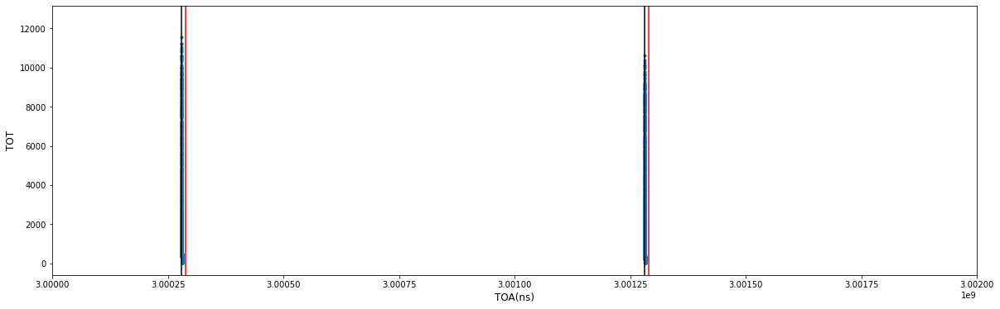

In [18]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]
plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
plt.plot(oth_df['#ToA']/4096.*25.,oth_df['#ToT[arb]'], '.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOA(ns)',fontsize = 12)
plt.ylabel('TOT',fontsize = 12)
for i in range(5000):
    plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
    plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
plt.xlim(3e9, 3.002e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbox_inches='tight')
time.ctime()

'Fri Apr  2 17:07:58 2021'

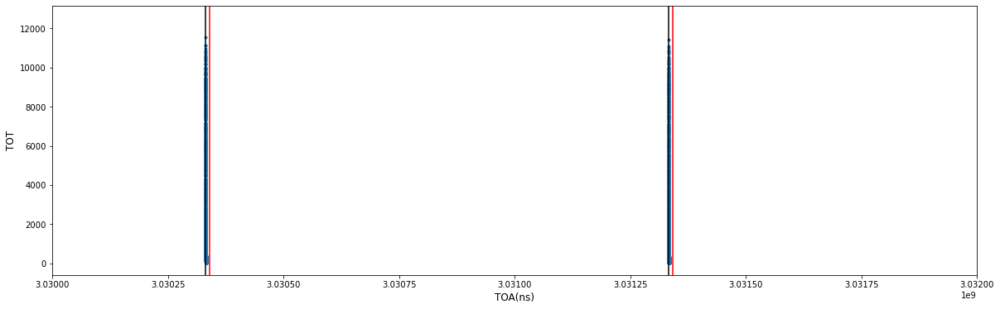

In [19]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]
plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
plt.plot(oth_df['#ToA']/4096.*25.,oth_df['#ToT[arb]'], '.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOA(ns)',fontsize = 12)
plt.ylabel('TOT',fontsize = 12)
for i in range(5000):
    plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
    plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
plt.xlim(3.03e9, 3.032e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbox_inches='tight')
time.ctime()

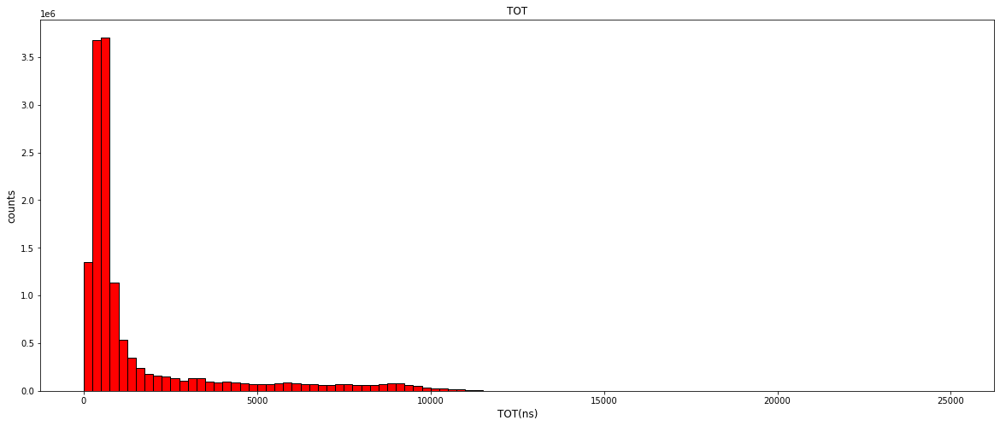

In [20]:
fig, ax1 = plt.subplots(ncols=1, figsize=(20, 8))

nbins = 100

plt.hist(oth_df['#ToT[arb]'], bins= nbins, range = [0, 25000], color = 'r', ec = 'k')
plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOT(ns)',fontsize = 12)
plt.ylabel('counts',fontsize = 12)
# plt.hist(Pt1_df['#ToT[arb]'], bins= nbins, range = [0, 20000], lw=3, histtype='step', label = 'file 2', color = 'red')

# plt.xlabel('ToT, ns')
# plt.legend()
plt.show()

'Fri Apr  2 17:10:02 2021'

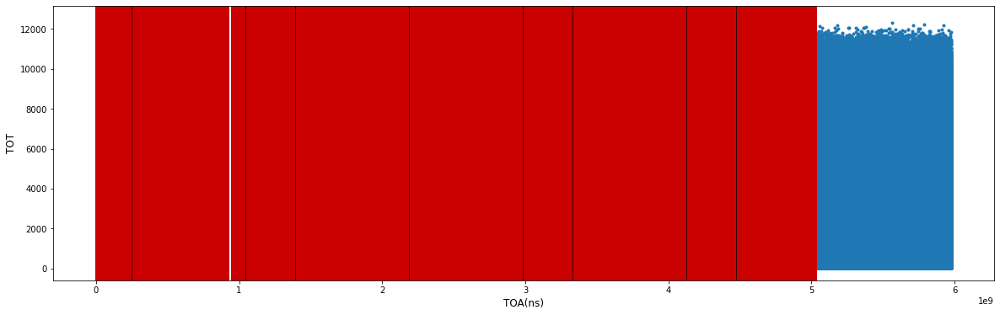

In [21]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]
plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
plt.plot(oth_df['#ToA']/4096.*25.,oth_df['#ToT[arb]'], '.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOA(ns)',fontsize = 12)
plt.ylabel('TOT',fontsize = 12)
for i in range(5000):
    plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
    plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
# plt.xlim(3e9, 3.002e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbox_inches='tight')
time.ctime()

'Sat Apr  3 16:09:37 2021'

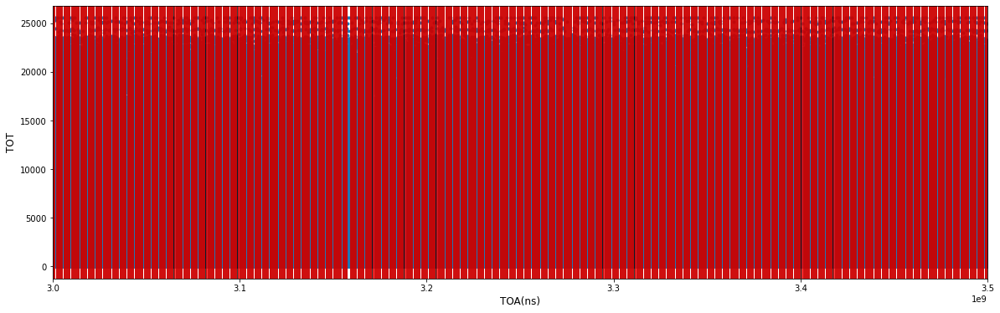

In [39]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]
plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
plt.plot(first_df['#ToA']/4096.*25.,first_df['#ToT[arb]'], '.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOA(ns)',fontsize = 12)
plt.ylabel('TOT',fontsize = 12)
for i in range(5000):
    plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
    plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
plt.xlim(3e9, 3.5e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbox_inches='tight')
time.ctime()

'Sat Apr  3 16:10:11 2021'

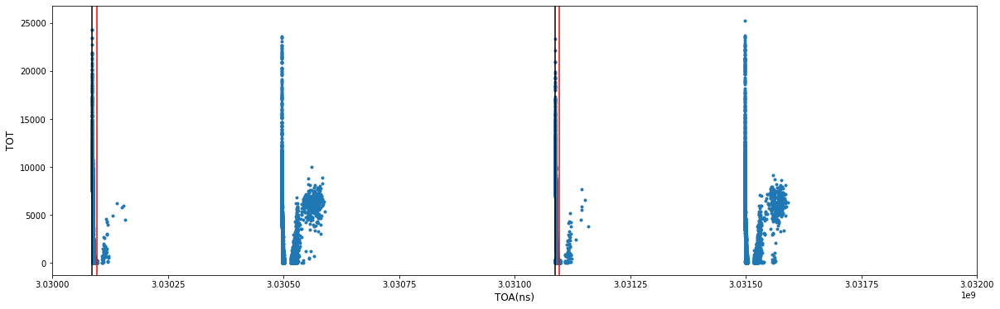

In [40]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]
plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
plt.plot(first_df['#ToA']/4096.*25.,first_df['#ToT[arb]'], '.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOA(ns)',fontsize = 12)
plt.ylabel('TOT',fontsize = 12)
for i in range(5000):
    plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
    plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
# plt.xlim(3e9, 3.002e9)
plt.xlim(3.03e9, 3.032e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbofirst_inches='tight')
time.ctime()

'Sat Apr  3 16:10:36 2021'

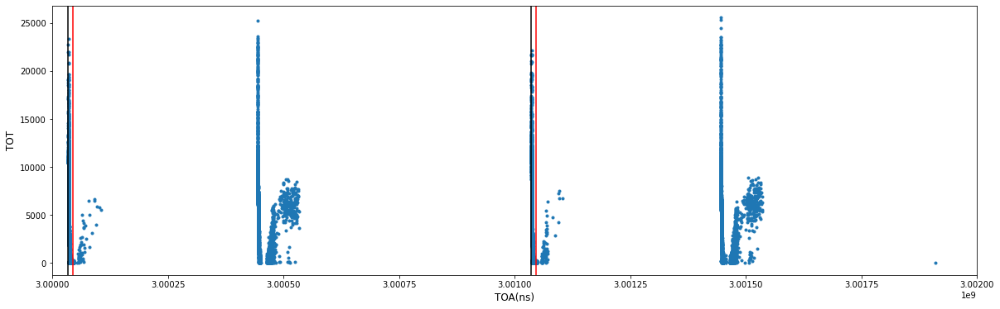

In [41]:
# r1 = t1[len(t1)//2:]/4096*25
# f1 = a1[len(a1)//2:]
plt.rcParams["figure.figsize"] = (20,6)
#len(t) = 8550085 
#
#plt.scatter(r,f)
plt.plot(first_df['#ToA']/4096.*25.,first_df['#ToT[arb]'], '.')
#plt.plot(r, f, 'xb-')
#plt.title("TOT", fontsize = 12) # change the title
plt.xlabel('TOA(ns)',fontsize = 12)
plt.ylabel('TOT',fontsize = 12)
for i in range(5000):
    plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
    plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
# plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
# plt.xlim(963691753.125-50, 963691753.125+250)
# plt.xlim(3.25875e9, 3.2592e9)
plt.xlim(3e9, 3.002e9)
# plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbofirst_inches='tight')
time.ctime()

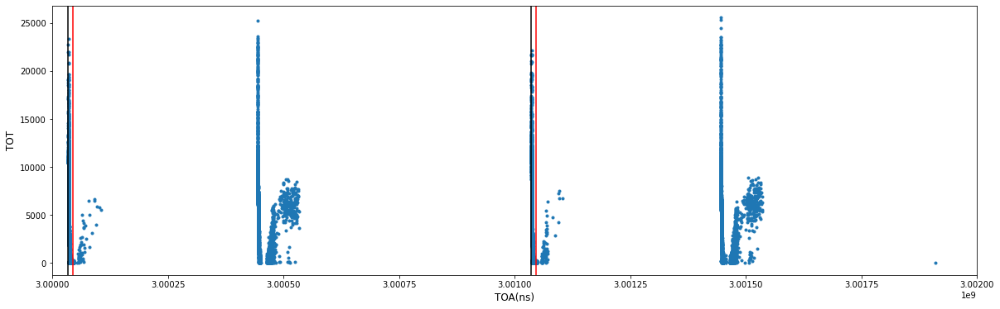

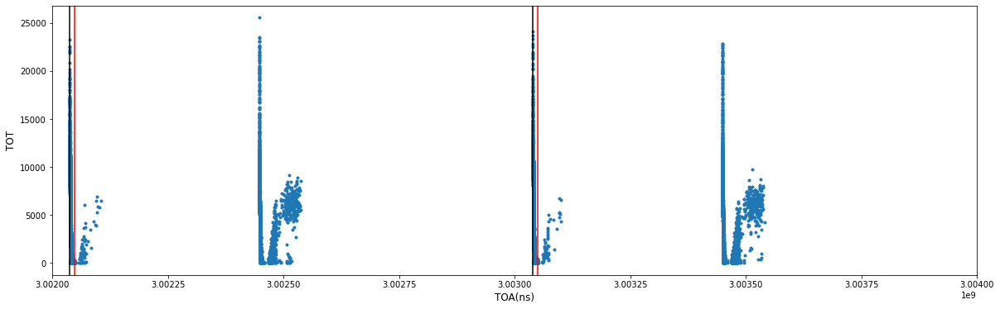

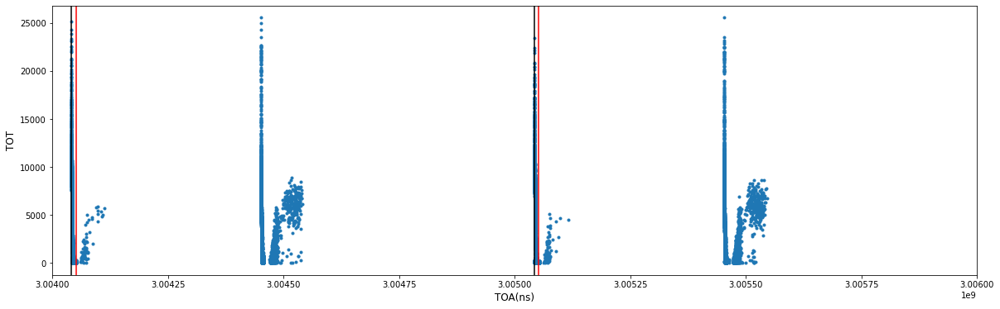

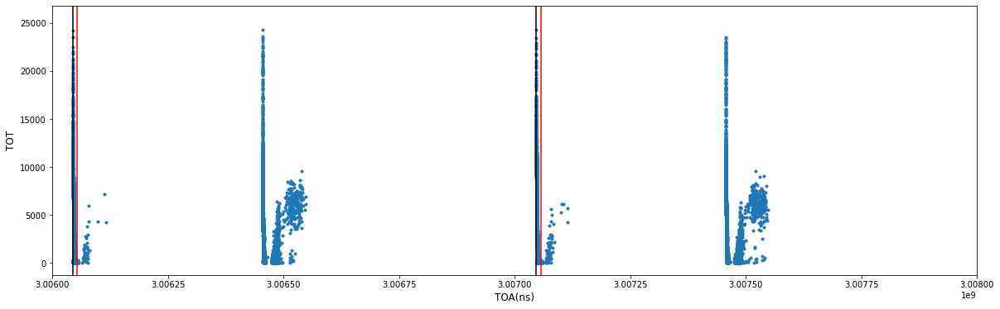

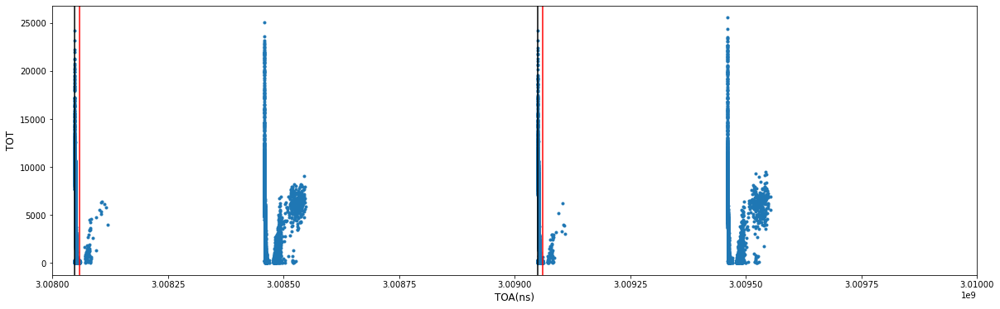

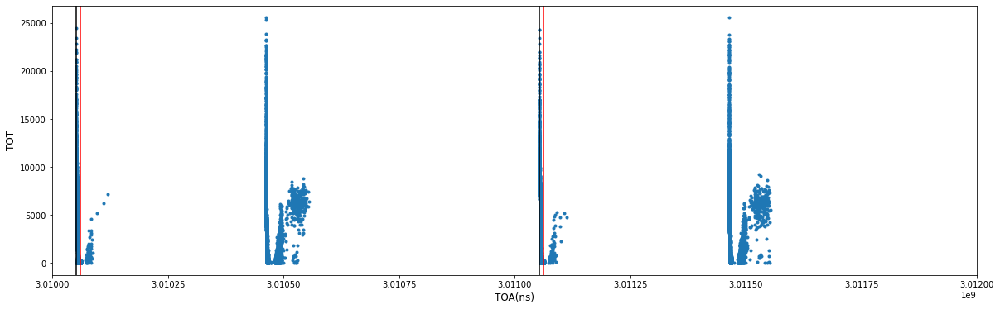

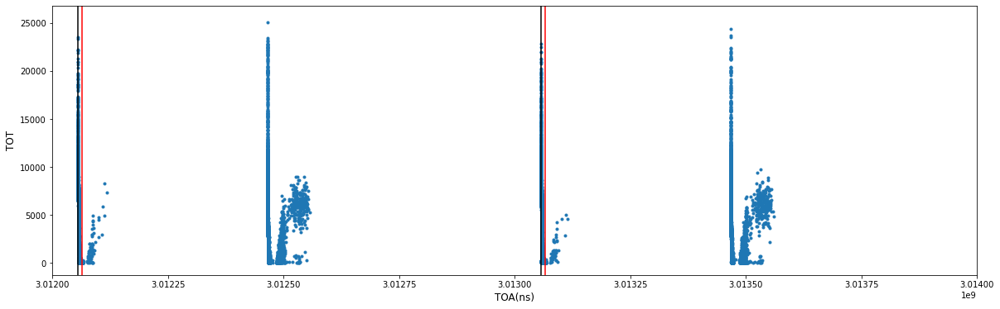

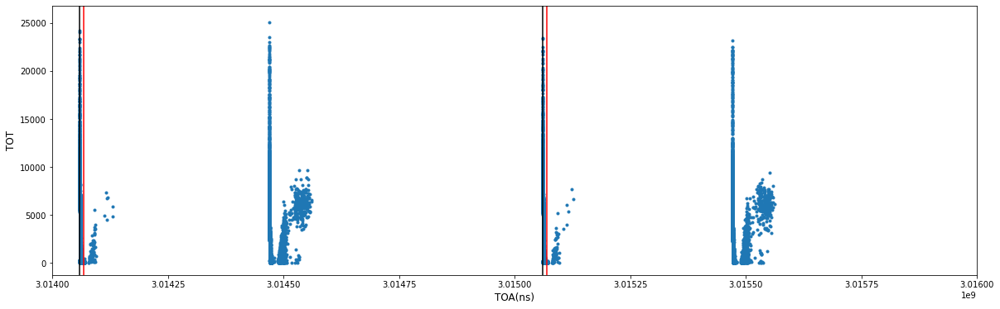

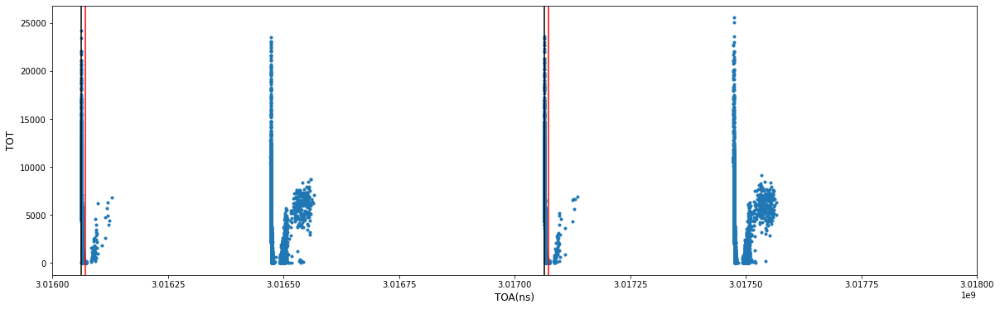

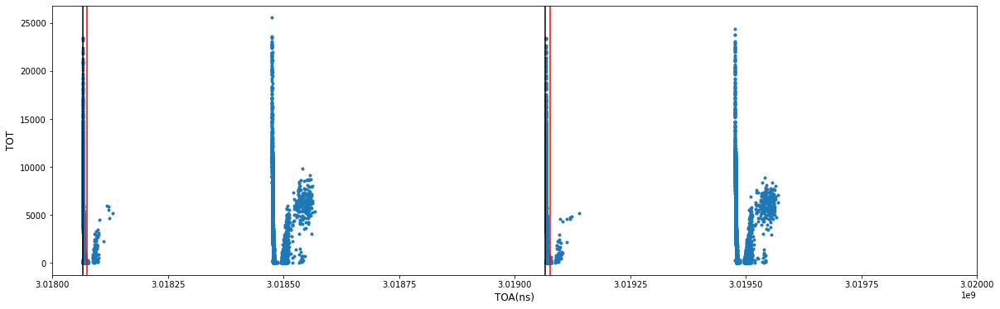

In [51]:
plt.rcParams["figure.figsize"] = (20,6)
for k in range(10):
    # r1 = t1[len(t1)//2:]/4096*25
    # f1 = a1[len(a1)//2:]
    
    #len(t) = 8550085 
    #
    #plt.scatter(r,f)
    plt.plot(first_df['#ToA']/4096.*25.,first_df['#ToT[arb]'], '.')
    #plt.plot(r, f, 'xb-')
    #plt.title("TOT", fontsize = 12) # change the title
    plt.xlabel('TOA(ns)',fontsize = 12)
    plt.ylabel('TOT',fontsize = 12)
    for i in range(5000):
        plt.axvline(x=(TrigTime[i]/4096.*25.), ymin=0, ymax=2500, color='k')
        plt.axvline(x=((TrigTime[i]/4096.*25.)+10000), ymin=0, ymax=2500, color='r')
    # plt.axvline(x=(TOA_MIN/4096.*25.), ymin=0, ymax=2500, color='k')
    # plt.xlim(963691753.125-50, 963691753.125+250)
    # plt.xlim(3.25875e9, 3.2592e9)
    plt.xlim(3e9+((3.002e9-3e9)*k), 3.002e9+((3.002e9-3e9)*k))
    # plt.savefig('TOTvsTOA_256x256_8212020_025447-1_cent.png', bbofirst_inches='tight')
    plt.show()
    time.ctime()

In [43]:
((679372501/4096.*250.)-(515253589/4096.*25.))*10**(-6)

38.32074841918945

In [44]:
trigDiffList = [(TrigTime[i+1]-TrigTime[i]) for i in range(len(TrigTime)-1)]
print(len(trigDiffList))

6917


In [45]:
print((mean(trigDiffList)/4096.*250.)*10**(-6))

10.053366577148436


In [46]:
for i in range(len(trigDiffList)):
    trigDiffList[i] = trigDiffList[i]/4096.*25

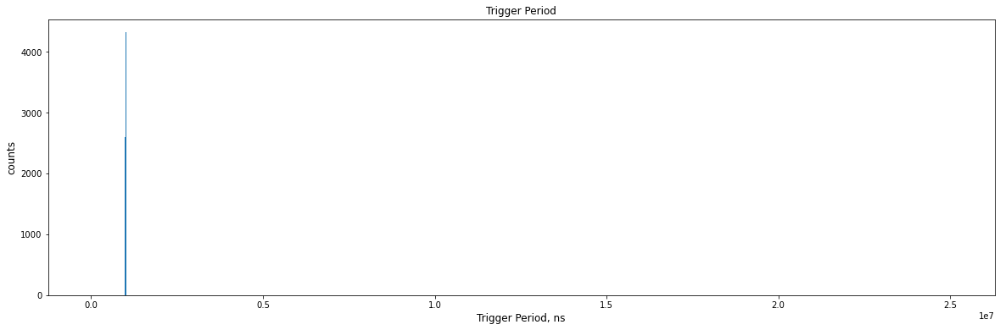

In [47]:
plt.rcParams["figure.figsize"] = (20,6)
(n, bins, patches) = plt.hist(trigDiffList, bins = 1000)
plt.title("Trigger Period", fontsize = 12) # change the title
plt.xlabel('Trigger Period, ns',fontsize = 12)
plt.ylabel('counts',fontsize = 12)
# plt.legend(loc='upper right')
# plt.xticks(bins[::80])
plt.show()

In [48]:
outliers=[]
for diff in trigDiffList:
    if diff > 1.1e6:
        outliers.append(diff)
print(len(outliers))
print(outliers)

3
[25042622.137451172, 2003412.7624511719, 2003407.5561523438]


In [42]:
def avg_delay(df):
    Delay_lst =[]
    nancount=0
    nonnancount=0
    for val in TrigTime:
        ToA_df = df[(df['#ToA'] > val) & (df['#ToA'] < (val+(100000*4096./25.)))]
        max_df = ToA_df[ToA_df['#ToT[arb]'] == (ToA_df['#ToT[arb]'].max())]
        Delay_lst.append((max_df['#ToA'].min()/4096.*25.)-(val/4096.*25))
        if math.isnan(Delay_lst[-1]):
            nancount+=1
        else:
            nonnancount+=1
    return np.nanmean(Delay_lst)*10**(-3), nancount, nonnancount

In [26]:
print("Average delay (0th):", avg_delay(oth_df)[0], 'us')

Average delay (0th): 0.9486069744465495 us


In [43]:
avgDelayFirst = avg_delay(first_df)
print("Average delay (1st):", avgDelayFirst[0], 'us')

Average delay (1st): 0.6911526968133888 us


In [44]:
avgDelayFirst[1]+avgDelayFirst[2], avgDelayFirst[1], avgDelayFirst[2]

(6918, 1960, 4958)

In [21]:
def avg_delay(df):
    Delay_lst =[]
    i=0
    nancount=0
    nonnancount=0
    for val in TrigTime:
        print("Trig#:", i)
        
        ToA_df = df[(df['#ToA'] > val) & (df['#ToA'] < (val+(100000*4096./25.)))]
        print("ToA df:")
        print("SHAPE:", ToA_df.shape, "\n", ToA_df.iloc[:2])
        
        
        Filtered_df = ToA_df[ToA_df['#ToT[arb]'] == (ToA_df['#ToT[arb]'].max())]
#         Filtered_df = df[((df['#ToA'] > val) \
#                           & (df['#ToA'] < (val+(100000*4096./25.)))) \
#                           & (df['#ToT[arb]'] == (df['#ToT[arb]'].max()))]
        print("Filtered df:")
        print("SHAPE:", Filtered_df.shape, "\n", Filtered_df.iloc[:2])
        
        
        peak = ((Filtered_df['#ToA'].min()/4096.*25.))
        print("toa_of_peak:", peak, "TrigTime[i]/4096.*25:",(val/4096.*25))
        
        Delay_lst.append(peak-(val/4096.*25))

        if math.isnan(Delay_lst[-1]):
            print ("NAN SUM DETECTED at Trig#", i, "\n")
            nancount+=1
        else:
            print("Valid delay calculation:", Delay_lst[-1], "\n")
            nonnancount+=1
        i+=1
                 
    return np.nanmean(Delay_lst)*10**(-3)

In [23]:
print("Average delay (0th):", avg_delay(oth_df), 'us')

Trig#: 0
ToA df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Filtered df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
toa_of_peak: nan TrigTime[i]/4096.*25: 796053.6437988281
NAN SUM DETECTED at Trig# 0 

Trig#: 1
ToA df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Filtered df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
toa_of_peak: nan TrigTime[i]/4096.*25: 1798275.0
NAN SUM DETECTED at Trig# 1 

Trig#: 2
ToA df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Filtered df:
SHAPE: (0, 9) 
 Emp

In [22]:
print("Average delay (1st):", avg_delay(first_df), 'us')

Trig#: 0
ToA df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Filtered df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
toa_of_peak: nan TrigTime[i]/4096.*25: 796053.6437988281
NAN SUM DETECTED at Trig# 0 

Trig#: 1
ToA df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Filtered df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
toa_of_peak: nan TrigTime[i]/4096.*25: 1798275.0
NAN SUM DETECTED at Trig# 1 

Trig#: 2
ToA df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Filtered df:
SHAPE: (0, 9) 
 Emp

In [9]:
def pulse_picker(df, ToAmin, ToAmax):
    pulse_df = df.drop(df[(df['#ToA'] < ToAmin) | (df['#ToA'] > ToAmax)].index)
    print("Full Pulse df:")
    print("SHAPE:", pulse_df.shape, "\n", pulse_df.iloc[:2])
    
    # Create df consisting of only the max ToTs
    pulse_max_df = pulse_df[pulse_df['#ToT[arb]'] == (pulse_df['#ToT[arb]'].max())]
    print("Max Pulse df:")
    print("SHAPE:", pulse_max_df.shape, "\n", pulse_max_df.iloc[:2])
    
    return pulse_max_df['#ToA'].min()/4096.*25.

In [10]:
Delay_lst = []
nancount=0
nonnancount=0
for i in range(len(TrigTime)):
    print("Trig#:", i)
    toa_of_peak = pulse_picker(first_df, TrigTime[i], (TrigTime[i]+(100000*4096./25.)))
    print("toa_of_peak:", toa_of_peak, "TrigTime[i]/4096.*25:",(TrigTime[i]/4096.*25))
    Delay_lst.append(toa_of_peak-(TrigTime[i]/4096.*25))
    
    if math.isnan(Delay_lst[-1]):
        print ("NAN SUM DETECTED at Trig#", i, "\n")
        nancount+=1
    else:
        print("Valid delay calculation:", Delay_lst[-1], "\n")
        nonnancount+=1
time.ctime()

Trig#: 0
Full Pulse df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Max Pulse df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
toa_of_peak: nan TrigTime[i]/4096.*25: 796053.6437988281
NAN SUM DETECTED at Trig# 0 

Trig#: 1
Full Pulse df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Max Pulse df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
toa_of_peak: nan TrigTime[i]/4096.*25: 1798275.0
NAN SUM DETECTED at Trig# 1 

Trig#: 2
Full Pulse df:
SHAPE: (0, 9) 
 Empty DataFrame
Columns: [#TrigId, #TrigTime, #Col, #Row, #ToA, #ToT[arb], #ToTtotal[arb], #Trig-ToA[arb], Unnamed: 8]
Index: []
Max Pulse

'Tue Mar 30 14:51:33 2021'

In [12]:
print(nancount, nonnancount, nancount+nonnancount)

1928 3553 5481


In [13]:
print("Average delay (1st):", np.nanmean(Delay_lst)*10**(-3), 'us')

Average delay (1st): 0.7681321483110664 us
